# Задача выделения лиц

Реализация задачи выделения лиц на фото и видео с помощью различных библиотек

In [ ]:
!pip install face_recognition

In [ ]:
!pip install mtcnn

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
import os
import sys
import matplotlib.pyplot as plt
import face_recognition
from mtcnn import MTCNN
%matplotlib inline

In [ ]:
!wget https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_default.xml
!wget https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_profileface.xml

--2024-04-09 04:01:38--  https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_default.xml
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 930127 (908K) [text/plain]
Saving to: ‘haarcascade_frontalface_default.xml.1’

haarcascade_frontal 100%[===================>] 908.33K  --.-KB/s    in 0.04s   

2024-04-09 04:01:39 (22.8 MB/s) - ‘haarcascade_frontalface_default.xml.1’ saved [930127/930127]

--2024-04-09 04:01:39--  https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_profileface.xml
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.1

In [ ]:
!ls

haarcascade_frontalface_default.xml    haarcascade_profileface.xml    sample_data
haarcascade_frontalface_default.xml.1  haarcascade_profileface.xml.1


In [ ]:
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
    print('Файл(ы) "{name}" размером {length} байт загружен(ы)'.format(
        name=fn, length=len(uploaded[fn])))

Saving Jozin z Bazin.mp4 to Jozin z Bazin.mp4
Saving Ivo Pesak.jpg to Ivo Pesak.jpg
Saving Ivan Mladek.jpg to Ivan Mladek.jpg
Файл(ы) "Jozin z Bazin.mp4" размером 8101389 байт загружен(ы)
Файл(ы) "Ivo Pesak.jpg" размером 18400 байт загружен(ы)
Файл(ы) "Ivan Mladek.jpg" размером 7682 байт загружен(ы)


In [ ]:
input_video_path = 'Jozin z Bazin.mp4'

In [ ]:
photos = list(filter(lambda x : '.jpg' in x, os.listdir()))
photos

['Ivan Mladek.jpg', 'Ivo Pesak.jpg']

## 1. Выделение лиц в предоставленном видео и фото-образцах с помощью алгоритма каскада Хаара из библиотеки OpenCV.

In [ ]:
face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
face_profile_cascade = cv2.CascadeClassifier('haarcascade_profileface.xml')

In [ ]:
def face_det_cv2(photo_name):
    img = cv2.imread(photo_name)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, 1.1, 5, minSize=(50, 50)) # 1.1 и 5 - это гиперпараметры, их перебор позволяет регулировать детекцию
    for (x, y, w, h) in faces:
        cv2.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 5)
    faces = face_profile_cascade.detectMultiScale(gray, 1.1, 3, minSize=(200, 200))
    for (x, y, w, h) in faces:
        cv2.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 5)
    plt.figure(figsize=(8, 8), dpi=90)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()

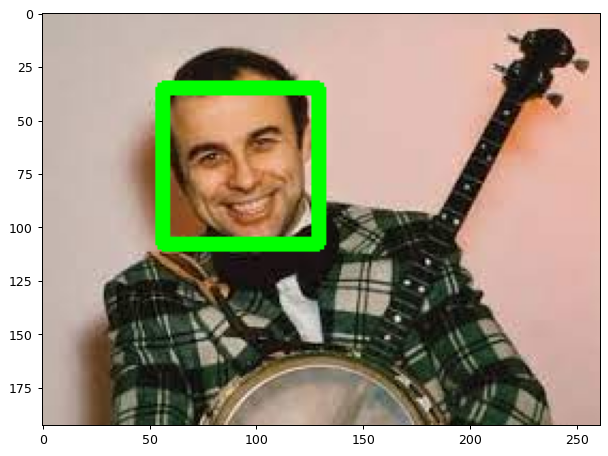

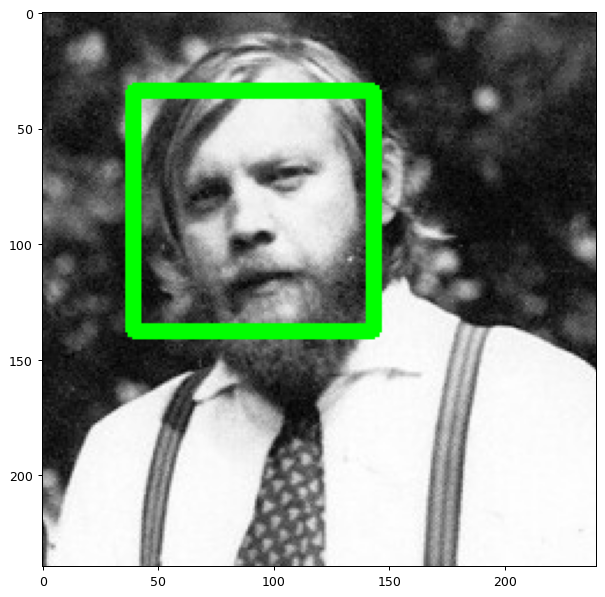

In [ ]:
for photo in photos:
    face_det_cv2(photo)

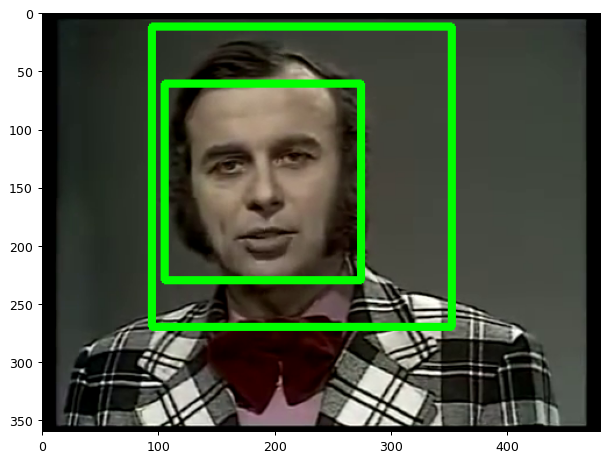

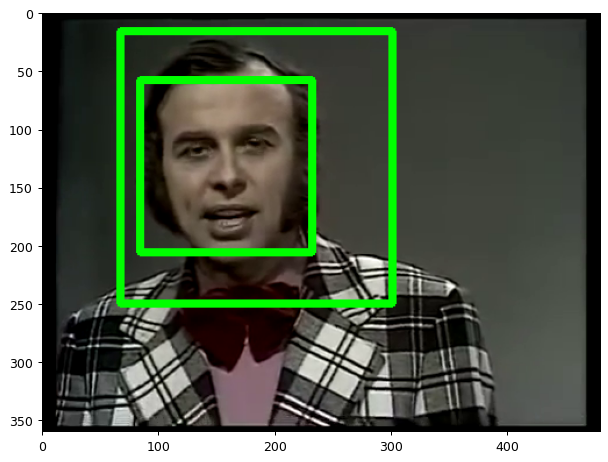

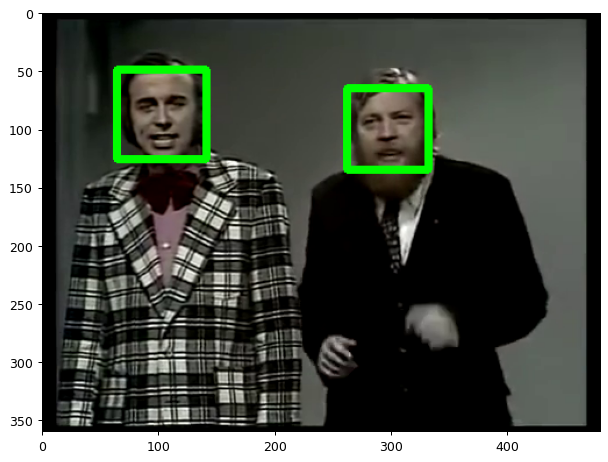

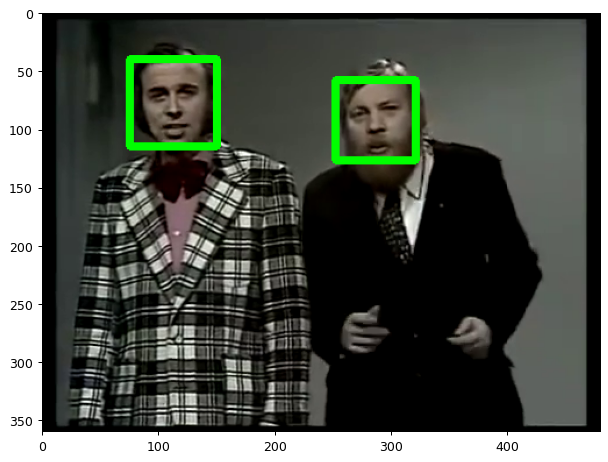

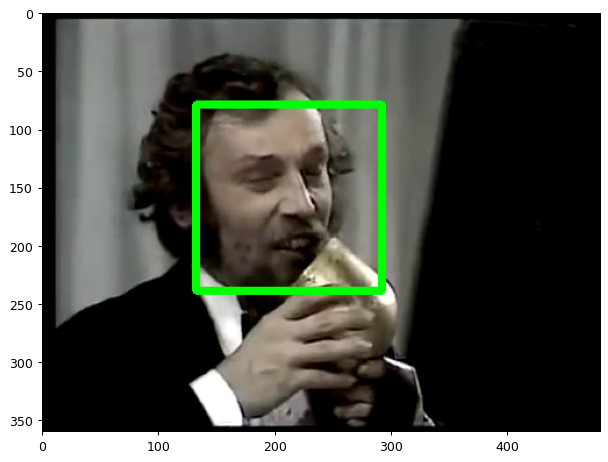

...

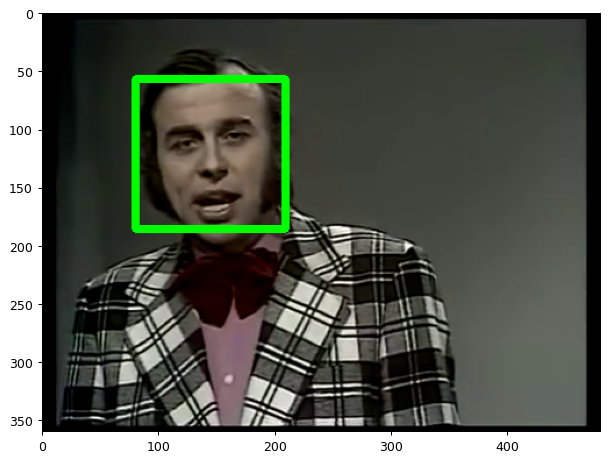

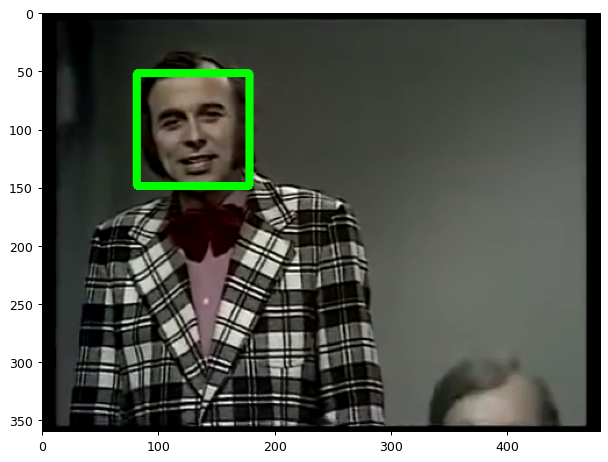

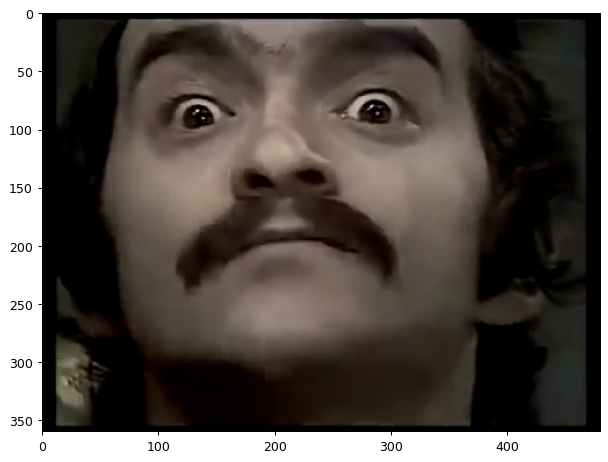

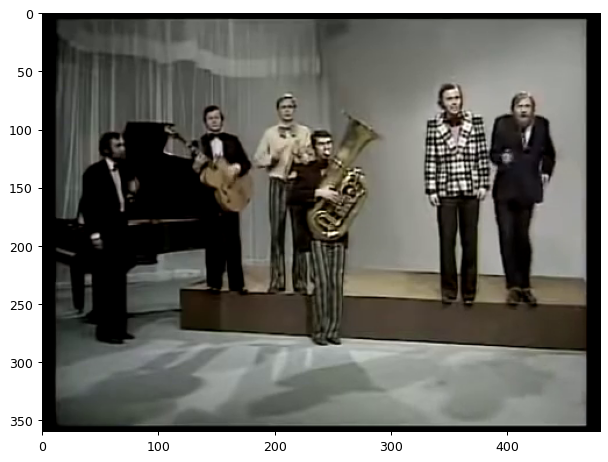

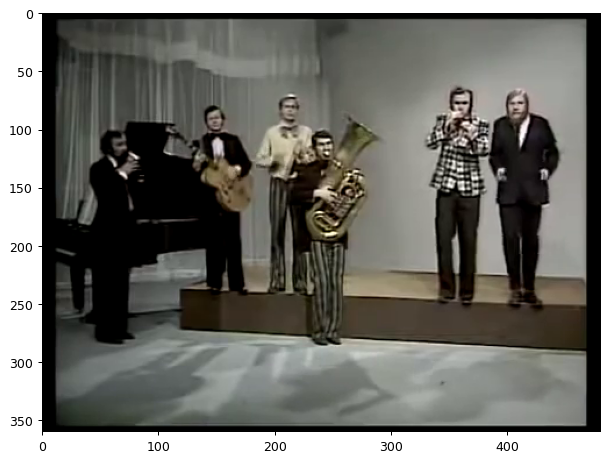

In [ ]:
cap = cv2.VideoCapture(input_video_path)
frame_width = int(cap.get(3))
frame_height = int(cap.get(4))
frame_rate = cap.get(5)
frame_number = 0
while True:
    ret, frame = cap.read()
    if not ret:
        break
    frame_number += 1

    if (frame_number % 240) == 0:
      gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
      faces = face_cascade.detectMultiScale(gray, 1.1, 5, minSize=(10, 10)) # 1.1 и 5 - это гиперпараметры, их перебор позволяет регулировать детекцию
      for (x, y, w, h) in faces:
          cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 255, 0), 5)
      faces = face_profile_cascade.detectMultiScale(gray, 1.1, 3, minSize=(200, 200))
      for (x, y, w, h) in faces:
          cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 255, 0), 5)
      plt.figure(figsize=(8, 8), dpi=90)
      plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
      plt.show()

cap.release()
cv2.destroyAllWindows()


## 2. Аналогичная задача с помощью библиотеки Face recognition.

In [ ]:
def face_det_fr(photo_name):
    image_processed = face_recognition.load_image_file(photo_name)
    face_location = face_recognition.face_locations(image_processed)
    img = cv2.imread(photo_name)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    for (top, right, bottom, left) in (face_location):
        cv2.rectangle(img, (left, top), (right, bottom), (0, 255, 0), 5)
    plt.figure(figsize=(8,8), dpi=90)
    plt.imshow(img)
    plt.show()

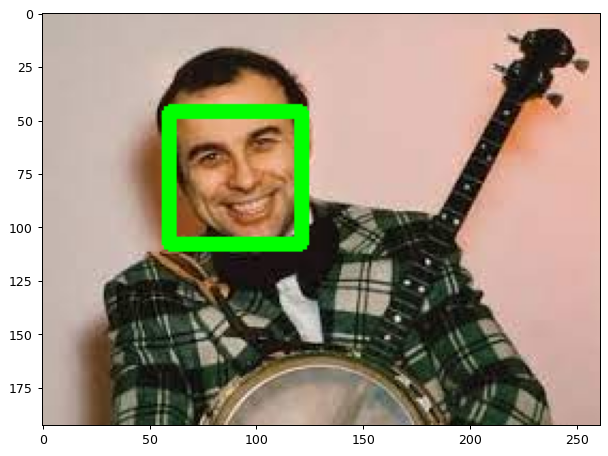

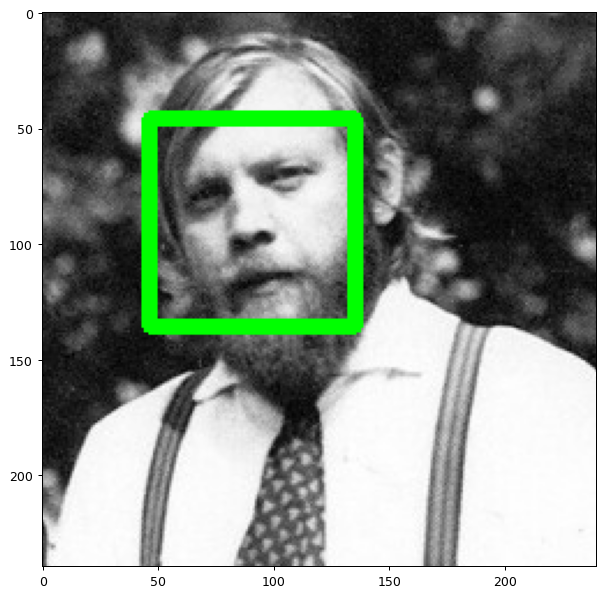

In [ ]:
for photo in photos:
    face_det_fr(photo)

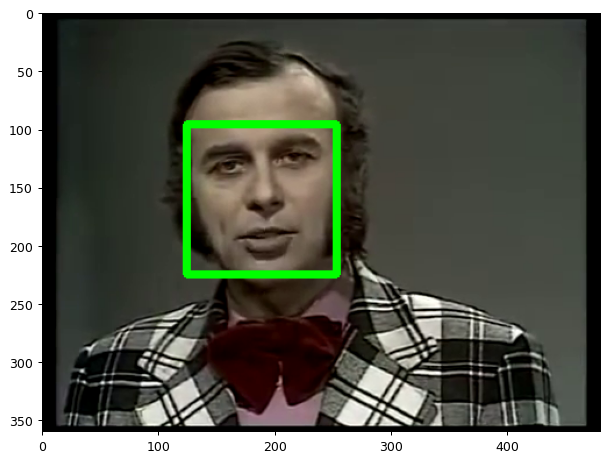

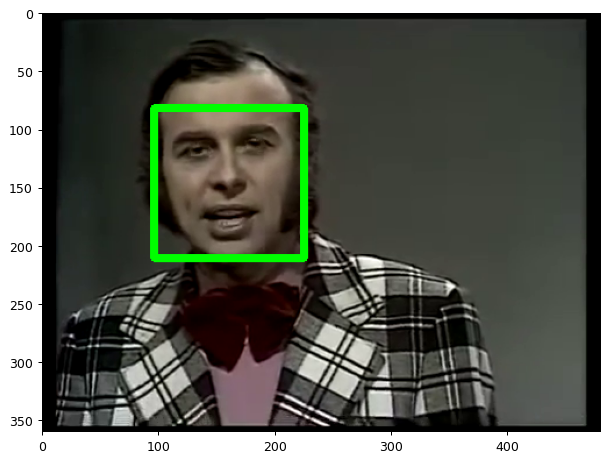

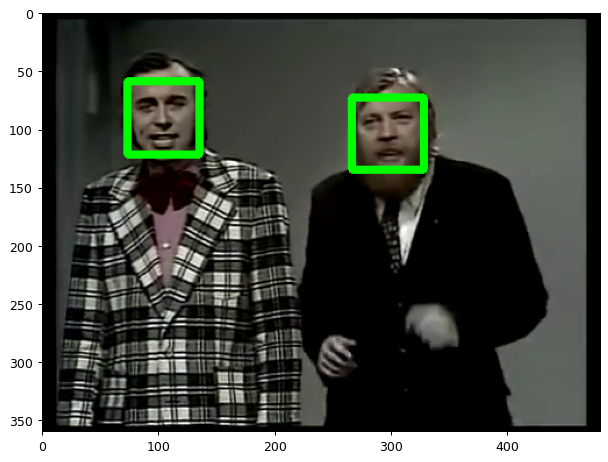

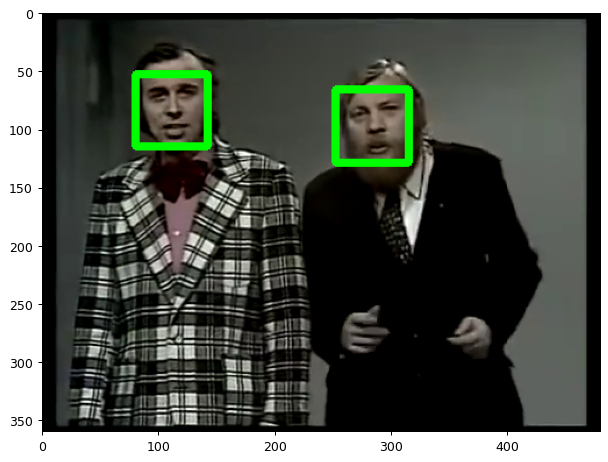

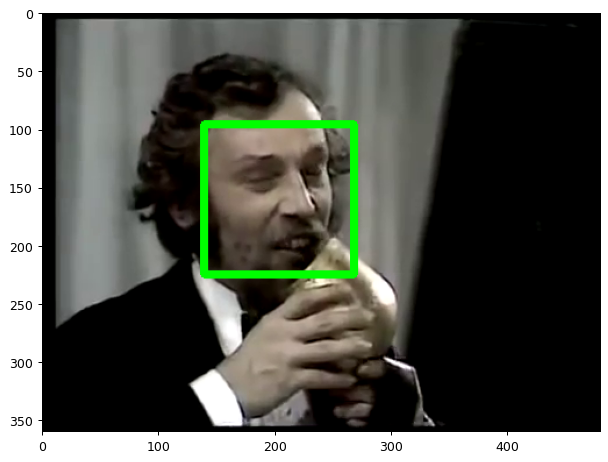

...

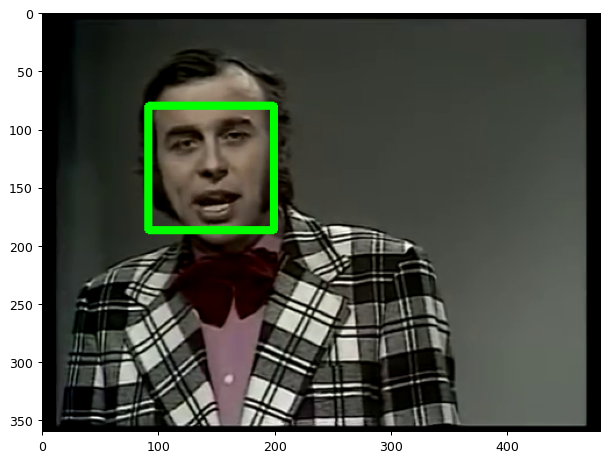

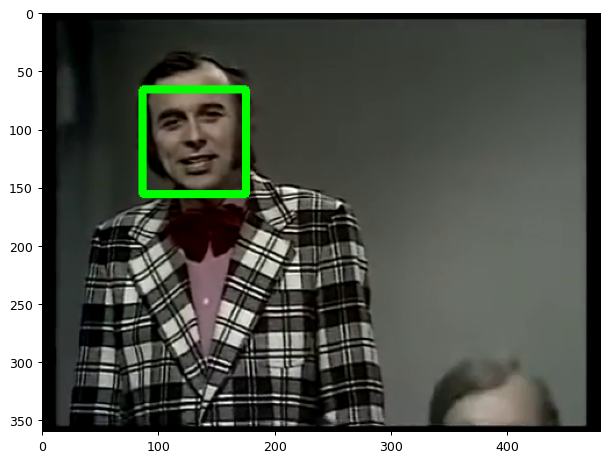

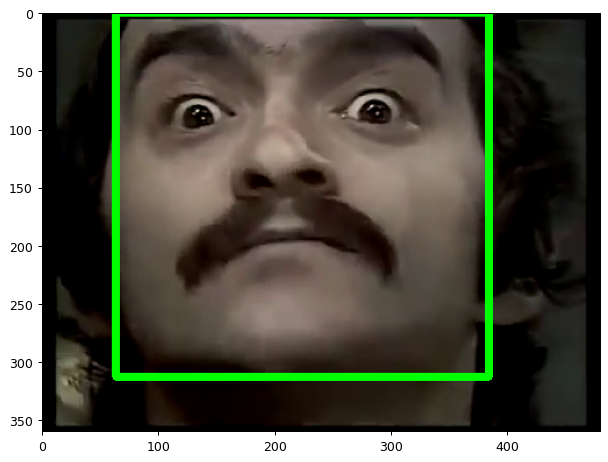

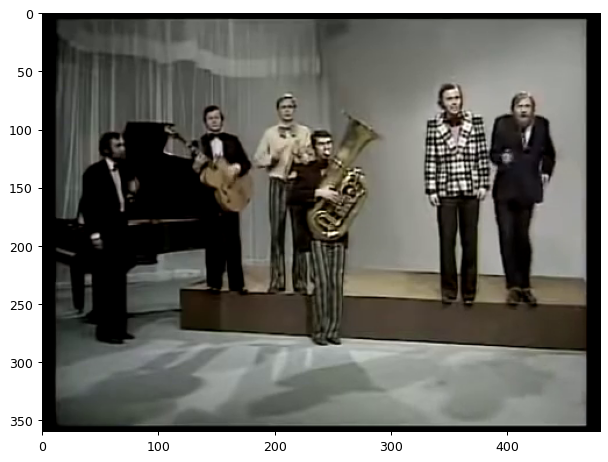

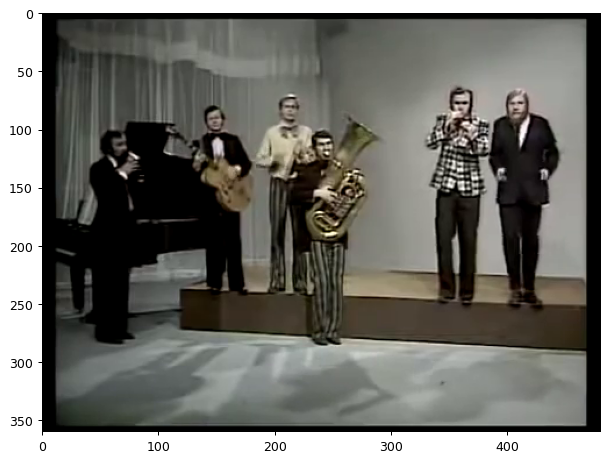

In [ ]:
cap = cv2.VideoCapture(input_video_path)
frame_width = int(cap.get(3))
frame_height = int(cap.get(4))
frame_rate = cap.get(5)
frame_number = 0
while True:
    ret, frame = cap.read()
    if not ret:
        break
    frame_number += 1
    if (frame_number % 240) == 0:
        face_locations = face_recognition.face_locations(frame)
        img = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        for (top, right, bottom, left) in face_locations:
            cv2.rectangle(img, (left, top), (right, bottom), (0, 255, 0), 5)
        plt.figure(figsize=(8, 8), dpi=90)
        plt.imshow(img)
        plt.show()

cap.release()
cv2.destroyAllWindows()


## 3. Аналогичная задача с помощью библиотеки MTCNN.

In [ ]:
def face_det_mtcnn(photo_name):
    img = cv2.imread(photo_name)
    detector = MTCNN()

    face_list = detector.detect_faces(img)

    for face in face_list:
        box = face["box"]
        keypoints = face["keypoints"]

        x,y,w,h = box
        cv2.rectangle(img,(x,y),(x+w,y+h),(0,255,0),5)

        cv2.circle(img,keypoints["left_eye"],1,(0,0,255),5)
        cv2.circle(img,keypoints["right_eye"],1,(0,0,255),5)
        cv2.circle(img,keypoints["nose"],1,(0,0,255),5)
        cv2.circle(img,keypoints["mouth_left"],1,(0,0,255),5)
        cv2.circle(img,keypoints["mouth_right"],1,(0,0,255),5)

    plt.figure(figsize=(8, 8), dpi=90)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()

1/1 [==============================] - 0s 257ms/step


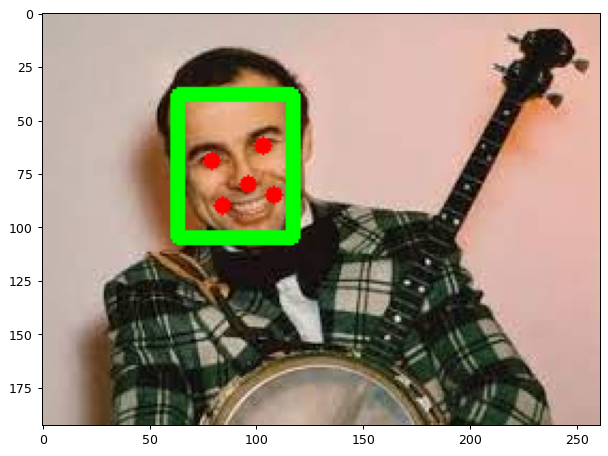

1/1 [==============================] - 0s 239ms/step


1/1 [==============================] - 0s 251ms/step


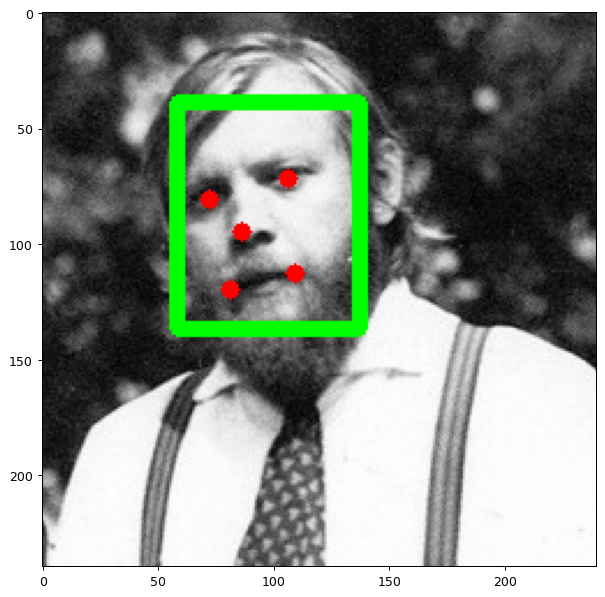

In [ ]:
for photo in photos:
    face_det_mtcnn(photo)

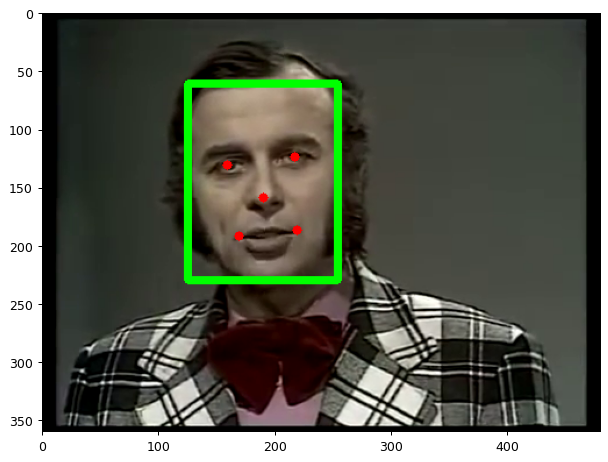

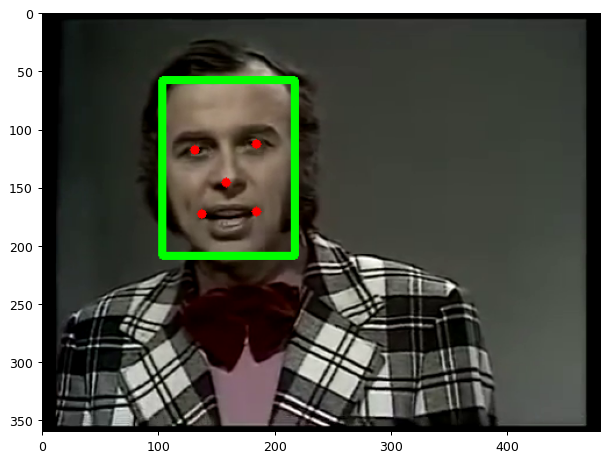

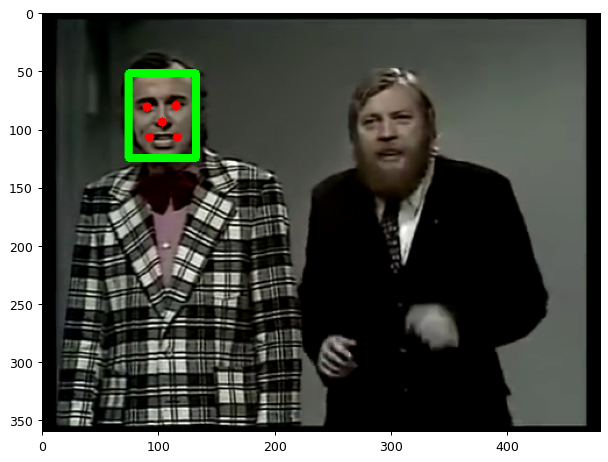

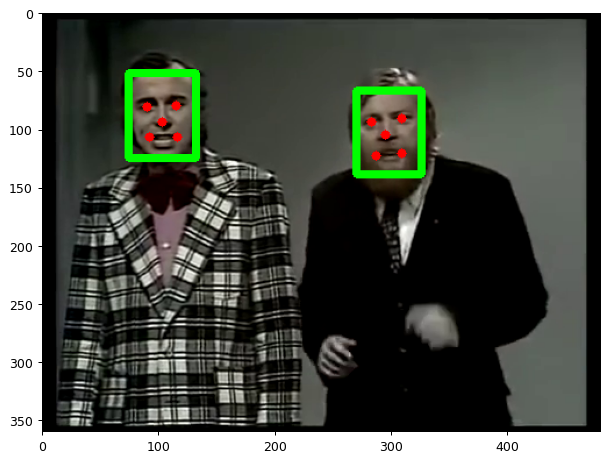

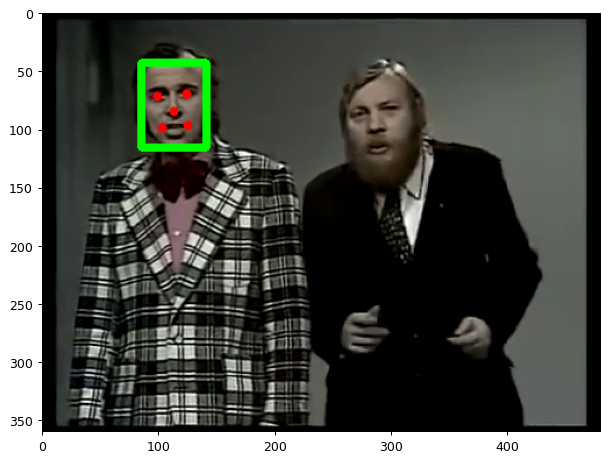

...

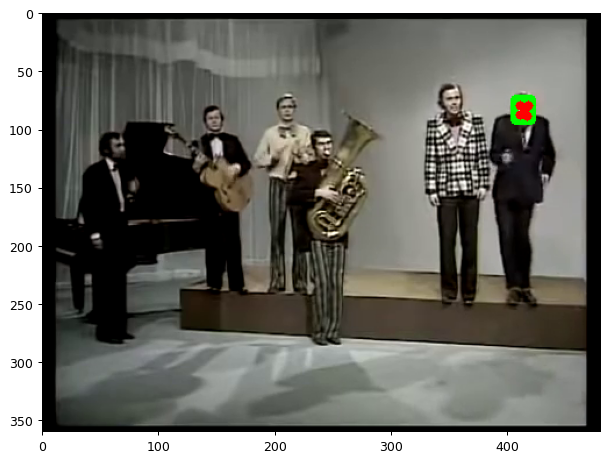

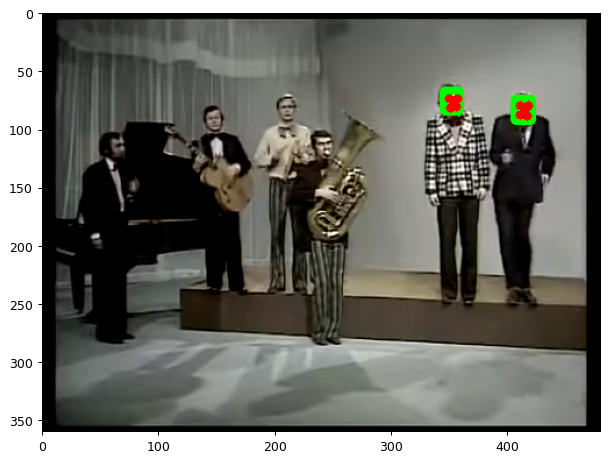

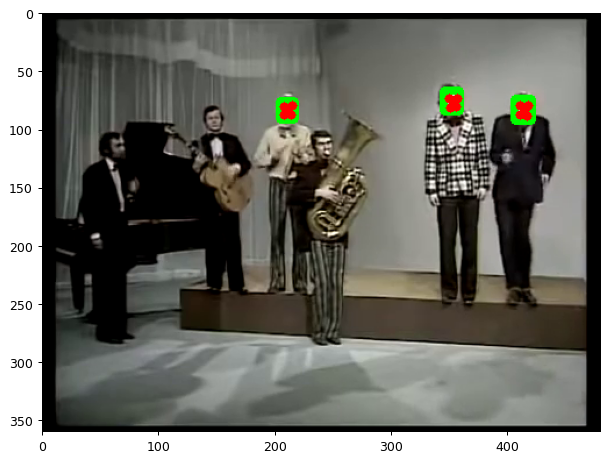

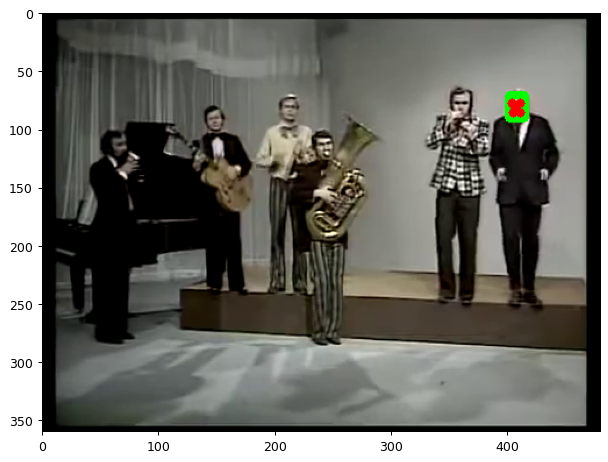

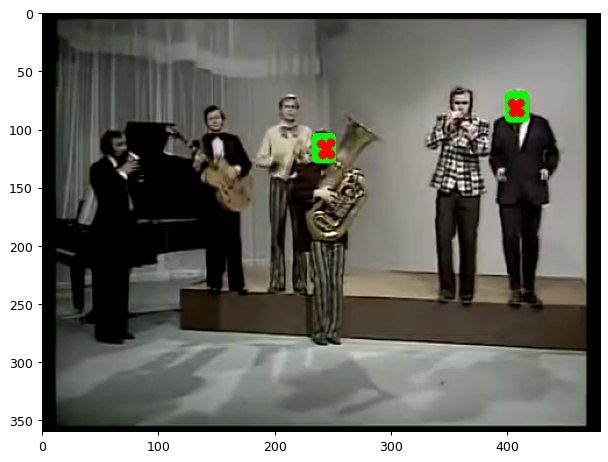

In [ ]:
cap = cv2.VideoCapture(input_video_path)
frame_width = int(cap.get(3))
frame_height = int(cap.get(4))
frame_rate = cap.get(5)
frame_number = 0
while True:
    ret, frame = cap.read()
    if not ret:
        break
    frame_number += 1

    if (frame_number % 240) == 0:
        detector = MTCNN()
        sys.stdout = open(os.devnull, 'w')
        face_list = detector.detect_faces(frame)
        sys.stdout = sys.__stdout__

        for face in face_list:
            box = face["box"]
            keypoints = face["keypoints"]

            x,y,w,h = box
            cv2.rectangle(frame,(x,y),(x+w,y+h),(0,255,0),5)

            cv2.circle(frame,keypoints["left_eye"],1,(0,0,255),5)
            cv2.circle(frame,keypoints["right_eye"],1,(0,0,255),5)
            cv2.circle(frame,keypoints["nose"],1,(0,0,255),5)
            cv2.circle(frame,keypoints["mouth_left"],1,(0,0,255),5)
            cv2.circle(frame,keypoints["mouth_right"],1,(0,0,255),5)
            plt.figure(figsize=(8, 8), dpi=90)
            plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
            plt.show()

cap.release()
cv2.destroyAllWindows()


**Вывод:**
С выделением лиц на фотографии все методы справились. На видео алгоритм каскада Хаара не смог выделить слишком больше лицо. Лучше всего сработал MTCNN. Он смог выделить некоторые лица, которые находятся далеко.

## 4. Задача одновременного выделения в предоставленном видео 2-х лиц, задаваемых фото-образцами.

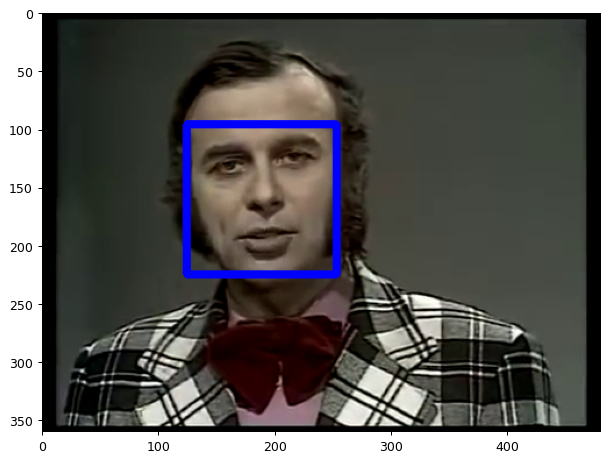

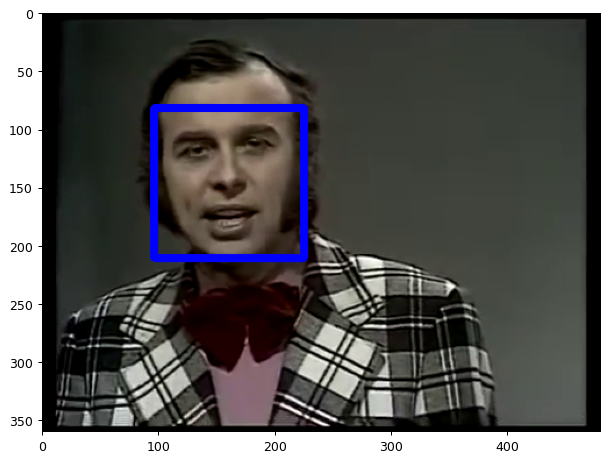

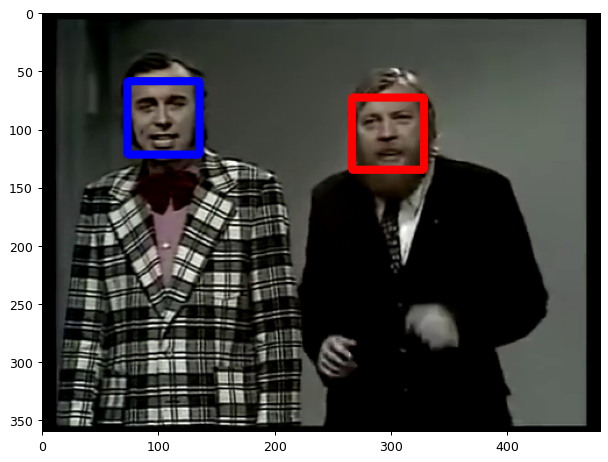

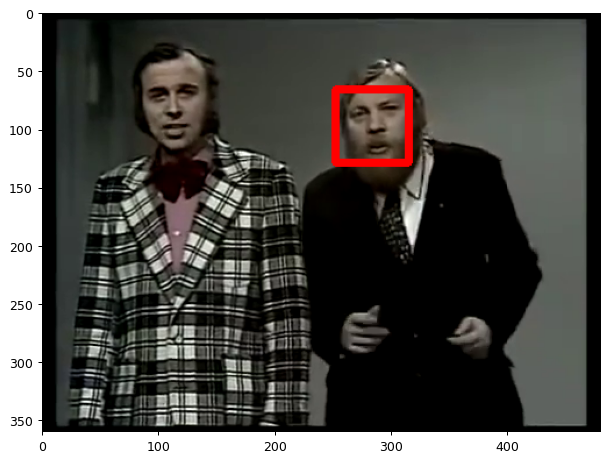

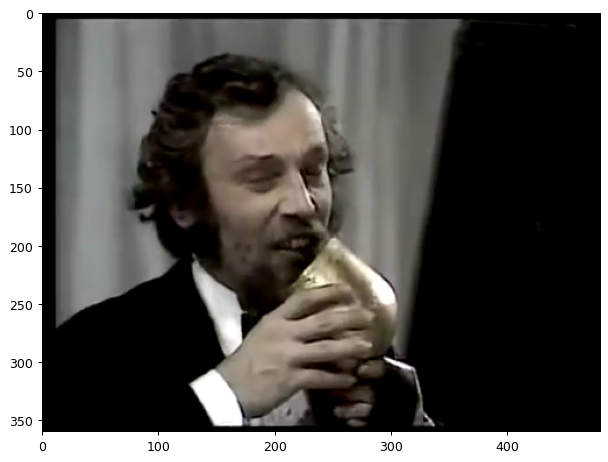

...

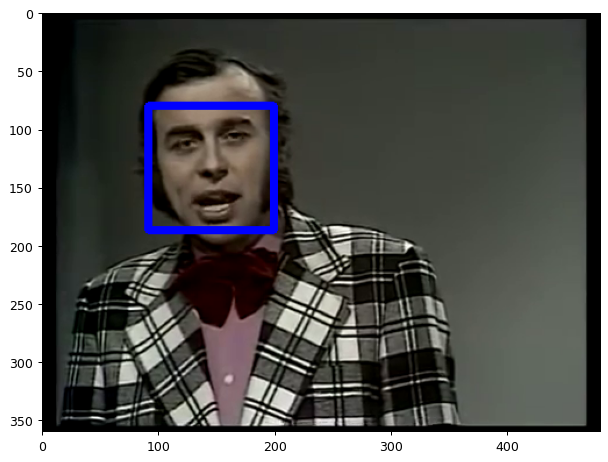

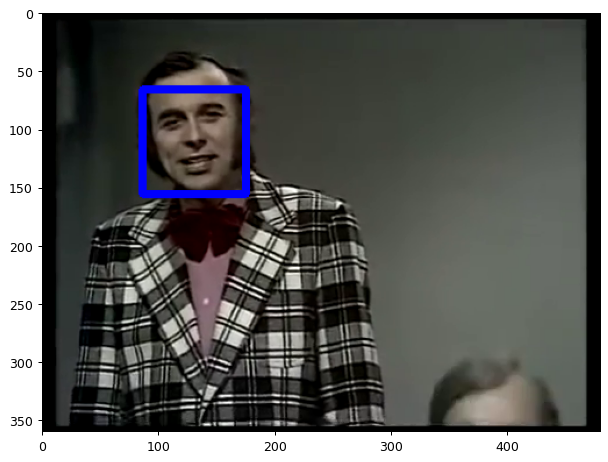

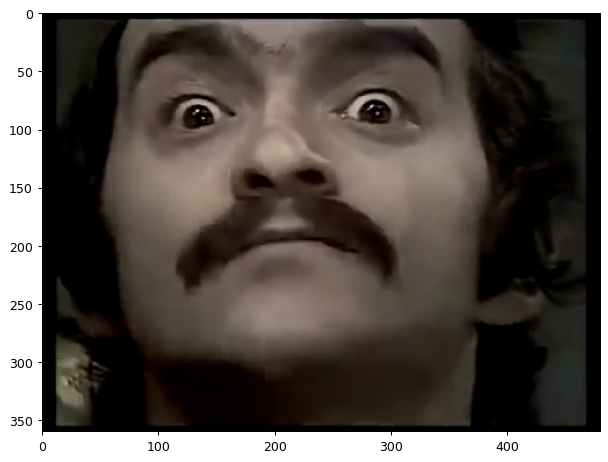

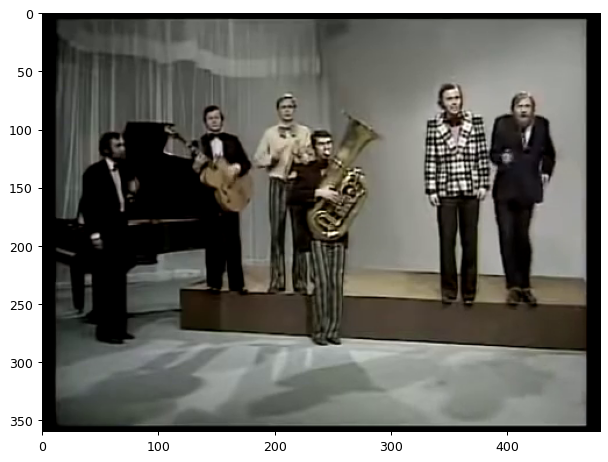

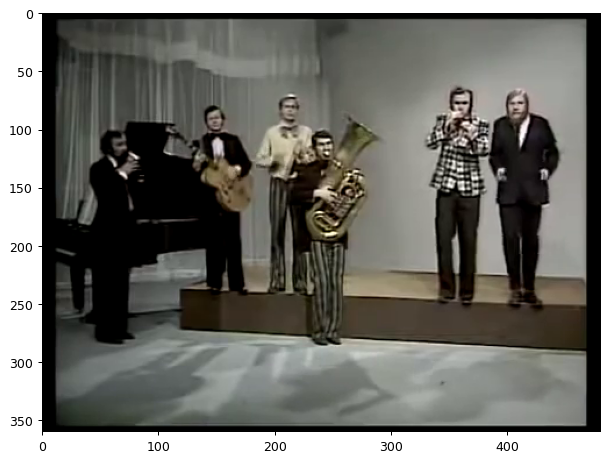

In [ ]:
import cv2
import face_recognition
import matplotlib.pyplot as plt

def detect_faces_in_video(input_video_path, sample_face1_path, sample_face2_path):
    sample_face1 = face_recognition.load_image_file(sample_face1_path)
    sample_face2 = face_recognition.load_image_file(sample_face2_path)

    sample_face_encoding1 = face_recognition.face_encodings(sample_face1)[0]
    sample_face_encoding2 = face_recognition.face_encodings(sample_face2)[0]

    cap = cv2.VideoCapture(input_video_path)
    frame_number = 0

    while True:
        ret, frame = cap.read()
        if not ret:
            break
        frame_number += 1

        if (frame_number % 240) == 0:
            face_locations = face_recognition.face_locations(frame)
            face_encodings = face_recognition.face_encodings(frame, face_locations)

            for (top, right, bottom, left), face_encoding in zip(face_locations, face_encodings):
                matches1 = face_recognition.compare_faces([sample_face_encoding1], face_encoding)
                matches2 = face_recognition.compare_faces([sample_face_encoding2], face_encoding)

                if matches1[0]:
                    cv2.rectangle(frame, (left, top), (right, bottom), (0, 0, 255), 5)

                if matches2[0]:
                    cv2.rectangle(frame, (left, top), (right, bottom), (255, 0, 0), 5)

            plt.figure(figsize=(8, 8), dpi=90)
            plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
            plt.show()

    cap.release()
    cv2.destroyAllWindows()

input_video_path = 'Jozin z Bazin.mp4'
sample_face1_path = 'Ivo Pesak.jpg'
sample_face2_path = 'Ivan Mladek.jpg'

detect_faces_in_video(input_video_path, sample_face1_path, sample_face2_path)